# SAE explorer

10 hours of investigation into Sparse Autoencoders, as part of the interview process for [Neel Nanda's MATS stream](https://www.matsprogram.org/).


First task is to understand (practically, empirically) what problem SAEs are solving, and what the various open-source SAEs are showing for toy models. Get something local running.

Main goal is to try to develop enough ease with the dataset to be able to zoom around looking for features. Stretch goal is to start training my own SAEs. 

<!-- ### Thought stream: 

- What is an SAE?

See this paper: https://transformer-circuits.pub/2023/monosemantic-features/index.html

See https://www.alignmentforum.org/posts/f9EgfLSurAiqRJySD/open-source-sparse-autoencoders-for-all-residual-stream for some open-source SAEs for the GPT2 residual stream.



There is an absolute firehose of info out there, and the pace of change mean that lots of it is outdated or redundant -->

### Repro of the ARENA tutorial


 To start with, lets run through the tutorial [here](https://arena3-chapter1-transformer-interp.streamlit.app/[1.4]_Superposition_&_SAEs), then look at the Bloom eval work https://github.com/jbloomAus/mats_sae_training/blob/main/tutorials/evaluating_your_sae.ipynb and https://colab.research.google.com/github/jbloomAus/mats_sae_training/blob/main/tutorials/logits_lens_with_features.ipynb


c.f https://www.alignmentforum.org/posts/LnHowHgmrMbWtpkxx/intro-to-superposition-and-sparse-autoencoders-colab, which I think is mostly a dupe 



In [1]:
import os
import subprocess

In [2]:
def pull_arena_files(remote_path, local_path):
    # Check if the local directory exists, if not create it
    local_dir = os.path.dirname(local_path)
    if not os.path.exists(local_dir):
        os.makedirs(local_dir, exist_ok=True)
        init_path = os.path.join(local_dir, '__init__.py')
        if not os.path.exists(init_path):
            with open(init_path, 'w') as f:
                # Create an empty __init__.py to make it a package if needed
                f.write("# Package initialization file\n")
    
    # Download the file using wget
    wget_command = f"wget -O {local_path} {remote_path}"
    subprocess.run(wget_command, shell=True, check=True)
    
    # Annotate the file with the source URL
    annotation = f"# lifted from {remote_path}\n"
    with open(local_path, 'r+') as f:
        content = f.read()
        f.seek(0, 0)
        f.write(annotation + content)

pull_arena_files('https://raw.githubusercontent.com/callummcdougall/ARENA_3.0/main/chapter1_transformer_interp/exercises/plotly_utils.py', 
                 'src/plotly_utils.py')

pull_arena_files('https://raw.githubusercontent.com/callummcdougall/ARENA_3.0/main/chapter1_transformer_interp/exercises/part4_superposition_and_saes/utils.py', 
                 'src/saes_utils.py')


# turns out there's too many assumptions about the location these are run for this to be trivial
# pull_arena_files('https://raw.githubusercontent.com/callummcdougall/ARENA_3.0/main/chapter1_transformer_interp/exercises/part4_superposition_and_saes/tests.py', 
#                  'src/saes_tests.py')

# pull_arena_files('https://raw.githubusercontent.com/callummcdougall/ARENA_3.0/main/chapter1_transformer_interp/exercises/part4_superposition_and_saes/solutions.py', 
#                  'src/saes_solutions.py')

--2024-04-11 10:23:56--  https://raw.githubusercontent.com/callummcdougall/ARENA_3.0/main/chapter1_transformer_interp/exercises/plotly_utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22700 (22K) [text/plain]
Saving to: ‘src/plotly_utils.py’

     0K .......... .......... ..                              100% 8.67M=0.002s

2024-04-11 10:23:57 (8.67 MB/s) - ‘src/plotly_utils.py’ saved [22700/22700]

--2024-04-11 10:23:57--  https://raw.githubusercontent.com/callummcdougall/ARENA_3.0/main/chapter1_transformer_interp/exercises/part4_superposition_and_saes/utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185

In [3]:
# !sed -i 's/part4_superposition_and_saes.solutions/src.saes_solutions/g' src/saes_tests.py
# !sed -i 's/part4_superposition_and_saes.utils/src.saes_utils/g' src/saes_solutions.py
# !sed -i 's/part4_superposition_and_saes.tests/src.saes_tests/g' src/saes_solutions.py


In [14]:
import einops
import torch as t
import numpy as np

from dataclasses import dataclass
from jaxtyping import Float 
from torch import nn, Tensor
from torch.nn import functional as F
from tqdm import tqdm
from typing import  Callable, Union 


from src.plotly_utils import imshow, line
from src.saes_utils import (
    plot_features_in_2d,
    plot_features_in_Nd
)


device = t.device("cuda" if t.cuda.is_available() else "cpu")


### ARENA tutorial part one
build a toy model of superposition in which we:
* We take a 5-dimensional input $x$
* We map it down into 2D space
* We map it back up into 5D space (using the transpose of the first matrix)
* We add a bias and ReLU

$$
\begin{aligned}
h &= W x \\
x' &= \operatorname{ReLU}(W^T h + b)
\end{aligned}
$$

tensor([[-0.3314, -0.3261,  0.2579, -0.0644,  0.9868],
        [-1.6148,  0.1182, -1.0543,  0.2537,  0.8616]])


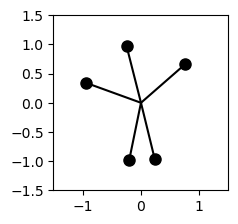

In [5]:
t.manual_seed(20240410)

W = t.randn(2, 5)
W_normed = W / W.norm(dim=0, keepdim=True)

print(W)
imshow(W_normed.T @ W_normed, title="Cosine similarities of each pair of 2D feature embeddings", width=600)
plot_features_in_2d(
    W_normed.unsqueeze(0), # shape [instances=1 d_hidden=2 features=5]
)

In [6]:
# Generate the toy model

def linear_lr(step, steps):
    return (1 - (step / steps))

def constant_lr(*_):
    return 1.0

def cosine_decay_lr(step, steps):
    return np.cos(0.5 * np.pi * step / (steps - 1))


@dataclass
class Config:
    # We optimize n_instances models in a single training loop to let us sweep over
    # sparsity or importance curves  efficiently. You should treat `n_instances` as
    # kinda like a batch dimension, but one which is built into our training setup.
    n_instances: int
    n_features: int = 5
    n_hidden: int = 2
    n_correlated_pairs: int = 0
    n_anticorrelated_pairs: int = 0


class Model(nn.Module):
    W: Float[Tensor, "n_instances n_hidden n_features"]
    b_final: Float[Tensor, "n_instances n_features"]

    def __init__(
        self,
        cfg: Config,
        feature_probability: Union[float, Tensor] | None = None,
        importance: Union[float, Tensor] | None = None,
        device = device,
    ):
        super().__init__()
        self.cfg = cfg

        if feature_probability is None: feature_probability = t.ones(())
        if isinstance(feature_probability, float): feature_probability = t.tensor(feature_probability)
        self.feature_probability = feature_probability.to(device).broadcast_to((cfg.n_instances, cfg.n_features))
        if importance is None: importance = t.ones(())
        if isinstance(importance, float): importance = t.tensor(importance)
        self.importance = importance.to(device).broadcast_to((cfg.n_instances, cfg.n_features))

        self.W = nn.Parameter(nn.init.xavier_normal_(t.empty((cfg.n_instances, cfg.n_hidden, cfg.n_features))))
        self.b_final = nn.Parameter(t.zeros((cfg.n_instances, cfg.n_features)))
        self.to(device)


    def forward(
        self,
        features: Float[Tensor, "... instances features"]
    ) -> Float[Tensor, "... instances features"]:

        hidden = einops.einsum(
           features, self.W,
           "... instances features, instances hidden features -> ... instances hidden"
        )
        out = einops.einsum(
            hidden, self.W,
            "... instances hidden, instances hidden features -> ... instances features"
        )
        return F.relu(out + self.b_final)

    def generate_batch(self, batch_size) -> Float[Tensor, "batch_size instances features"]:
        '''
        Returns a tensor of shape (n_batch, instances, features) where:
        - the instances and features values are taken from the model config
        - each feature is present with probability self.feature_probability
        - each present feature is sampled from a uniform distribution between 0 and 1
        '''
        # make a tensor of the right shape
        features = t.rand((batch_size, self.cfg.n_instances, self.cfg.n_features), device=self.W.device)

        # mask out the features
        feat_seeds = t.rand((batch_size, self.cfg.n_instances, self.cfg.n_features), device=self.W.device)
        feat_is_present = feat_seeds <= self.feature_probability
        batch = t.where(feat_is_present, features, 0.0)
    
        return batch



    def calculate_loss(
        self,
        out: Float[Tensor, "batch instances features"],
        batch: Float[Tensor, "batch instances features"],
    ) -> Float[Tensor, ""]:
        '''
        Calculates the loss for a given batch, using this loss described in the Toy Models paper:

            https://transformer-circuits.pub/2022/toy_model/index.html#demonstrating-setup-loss

        Remember, `model.importance` will always have shape (n_instances, n_features).
        '''
        error = self.importance * ((batch - out) ** 2)
        loss = einops.reduce(error, 'batch instances features -> instances', 'mean').sum()
        return loss


    def optimize(
        self,
        batch_size: int = 1024,
        steps: int = 10_000,
        log_freq: int = 100,
        lr: float = 1e-3,
        lr_scale: Callable[[int, int], float] = constant_lr,
    ):
        '''
        Optimizes the model using the given hyperparameters.
        '''
        optimizer = t.optim.Adam(list(self.parameters()), lr=lr)

        progress_bar = tqdm(range(steps))

        for step in progress_bar:

            # Update learning rate
            step_lr = lr * lr_scale(step, steps)
            for group in optimizer.param_groups:
                group['lr'] = step_lr

            # Optimize
            optimizer.zero_grad()
            batch = self.generate_batch(batch_size)
            out = self(batch)
            loss = self.calculate_loss(out, batch)
            loss.backward()
            optimizer.step()

            # Display progress bar
            if step % log_freq == 0 or (step + 1 == steps):
                progress_bar.set_postfix(loss=loss.item()/self.cfg.n_instances, lr=step_lr)


In [7]:
cfg = Config(10, 5, 2)
model = Model(cfg)
batch = model.generate_batch(10)
out_actual = model(batch)

print(out_actual)

tensor([[[0.0000e+00, 9.1542e-02, 1.9681e-02, 2.7364e-02, 0.0000e+00],
         [0.0000e+00, 7.8553e-03, 0.0000e+00, 4.6204e-02, 0.0000e+00],
         [3.1706e-02, 0.0000e+00, 3.4693e-03, 2.1531e-02, 3.2088e-02],
         [2.0466e-01, 5.9554e-02, 1.3641e-01, 1.6251e-01, 1.2755e-01],
         [0.0000e+00, 0.0000e+00, 1.8534e-02, 1.5293e-02, 0.0000e+00],
         [3.0314e-02, 1.0379e-01, 0.0000e+00, 0.0000e+00, 6.6816e-02],
         [4.3073e-02, 2.4631e-03, 6.1809e-03, 0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 4.3520e-02, 4.4445e-02, 8.9395e-02],
         [1.5554e-01, 2.0823e-01, 0.0000e+00, 4.6125e-02, 0.0000e+00],
         [0.0000e+00, 4.7188e-03, 1.6427e-03, 5.7063e-03, 0.0000e+00]],

        [[0.0000e+00, 0.0000e+00, 2.5118e-03, 3.5757e-03, 6.2206e-03],
         [0.0000e+00, 1.0776e-02, 0.0000e+00, 1.0730e-01, 0.0000e+00],
         [8.3416e-02, 0.0000e+00, 9.0664e-03, 5.6906e-02, 8.4649e-02],
         [2.6582e-01, 7.1900e-02, 1.6457e-01, 1.9513e-01, 1.6048e-01],
    

In [8]:
cfg = Config(
    n_instances = 8,
    n_features = 5,
    n_hidden = 2,
)

# importance varies within features for each instance
importance = (0.9 ** t.arange(cfg.n_features))
importance = einops.rearrange(importance, "features -> () features")

# sparsity is the same for all features in a given instance, but varies over instances
feature_probability = (50 ** -t.linspace(0, 1, cfg.n_instances))
feature_probability = einops.rearrange(feature_probability, "instances -> instances ()")

line(importance.squeeze(), width=600, height=400, title="Importance of each feature (same over all instances)", labels={"y": "Feature importance", "x": "Feature"})
line(feature_probability.squeeze(), width=600, height=400, title="Feature probability (varied over instances)", labels={"y": "Probability", "x": "Instance"})

100%|██████████| 10000/10000 [00:11<00:00, 837.28it/s, loss=0.0159, lr=0.001]


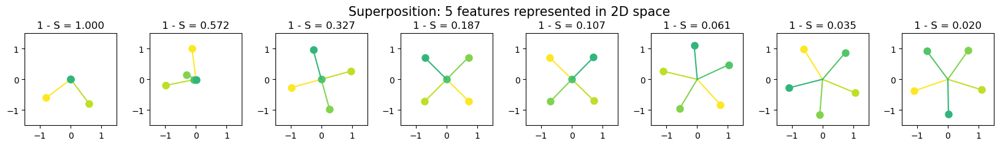

In [9]:
model = Model(
    cfg = cfg,
    device = device,
    importance = importance,
    feature_probability = feature_probability,
)
model.optimize(steps=10_000)

plot_features_in_2d(
    model.W.detach(),
    colors = model.importance,
    title = f"Superposition: {cfg.n_features} features represented in 2D space",
    subplot_titles = [f"1 - S = {i:.3f}" for i in feature_probability.squeeze()],
)


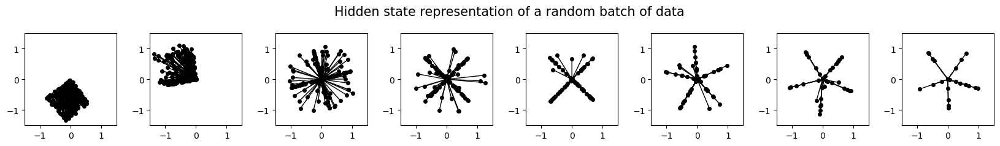

In [10]:
with t.inference_mode():
    batch = model.generate_batch(200)
    hidden = einops.einsum(batch, model.W, "batch_size instances features, instances hidden features -> instances hidden batch_size")

plot_features_in_2d(hidden, title = "Hidden state representation of a random batch of data")

In [12]:
n_features = 80
n_hidden = 20

importance = (0.9 ** t.arange(n_features))
importance = einops.rearrange(importance, "features -> () features")

feature_probability = t.tensor([1.0, 0.3, 0.1, 0.03, 0.01, 0.003, 0.001])
feature_probability = einops.rearrange(feature_probability, "instances -> instances ()")

cfg = Config(
    n_instances = len(feature_probability.squeeze()),
    n_features = n_features,
    n_hidden = n_hidden,
)

line(importance.squeeze(), width=600, height=400, title="Importance of each feature (same over all instances)", labels={"y": "Feature importance", "x": "Feature"})
line(feature_probability.squeeze(), width=600, height=400, title="Feature probability (varied over instances)", labels={"y": "Probability", "x": "Instance"})

model = Model(
    cfg = cfg,
    device = device,
    importance = importance,
    feature_probability = feature_probability,
)
model.optimize(steps=10_000)

100%|██████████| 10000/10000 [00:12<00:00, 783.53it/s, loss=0.000351, lr=0.001]


In [15]:
plot_features_in_Nd(
    model.W,
    height = 600,
    width = 1400,
    title = "ReLU output model: n_features = 80, d_hidden = 20, I<sub>i</sub> = 0.9<sup>i</sup>",
    subplot_titles = [f"Feature prob = {i:.3f}" for i in feature_probability[:, 0]],
)

100%|██████████| 25000/25000 [00:31<00:00, 800.67it/s, loss=0.00164, lr=0.001]


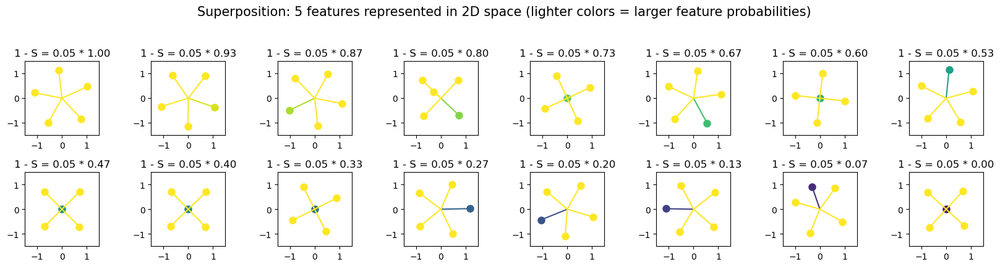

In [18]:
# now vary feature importance within features

cfg = Config(
    n_instances = 16,
    n_features = 5,
    n_hidden = 2,
)

# Now we vary feature probability within features (but same for all instances)
# we make all probs 0.05, except for the first feature which has smaller probability
feature_probability = t.full((cfg.n_instances, cfg.n_features), 0.05)
feature_probability[:, 0] *= t.linspace(0, 1, cfg.n_instances+1)[1:].flip(0)

model = Model(
    cfg = cfg,
    device = device,
    feature_probability = feature_probability,
)
model.optimize(steps=25_000)

plot_features_in_2d(
    model.W,
    colors = model.feature_probability * (1 / model.feature_probability.max()), # to help distinguish colors, we normalize to use the full color range
    title = f"Superposition: {cfg.n_features} features represented in 2D space (lighter colors = larger feature probabilities)",
    subplot_titles = [f"1 - S = 0.05 * {i:.2f}" for i in t.linspace(0, 1, cfg.n_instances).flip(0)],
    n_rows = 2,
)

### ARENA tutorial part 4

Building a SAE: take in the hidden state activations $h$, map them to a larger (overcomplete) hidden state $z$, then reconstruct the original hidden state $h$ from $z$.



$$
\begin{aligned}
h &= W x \\
x' &= \operatorname{ReLU}(W^T h + b)
\end{aligned}
$$



$$
\begin{aligned}
z &= \operatorname{ReLU}(W_{enc}(h - b_{dec}) + b_{enc}) \\
h' &= W_{dec}z + b_{dec}
\end{aligned}
$$

In [26]:
from typing import Tuple, List

@dataclass
class AutoEncoderConfig:
    n_instances: int
    n_input_ae: int
    n_hidden_ae: int
    l1_coeff: float = 0.5
    tied_weights: bool = False
    weight_normalize_eps: float = 1e-8


class AutoEncoder(nn.Module):
    W_enc: Float[Tensor, "n_instances n_input_ae n_hidden_ae"]
    W_dec: Float[Tensor, "n_instances n_hidden_ae n_input_ae"]
    b_enc: Float[Tensor, "n_instances n_hidden_ae"]
    b_dec: Float[Tensor, "n_instances n_input_ae"]


    def __init__(self, cfg: AutoEncoderConfig):
        '''
        Initializes the two weights and biases according to the type signature above.

        If self.cfg.tied_weights = True, then we only create W_enc, not W_dec.
        '''
        super().__init__()

        if not(cfg.tied_weights):
            self.W_dec = nn.Parameter(nn.init.xavier_normal_(t.empty((cfg.n_instances, cfg.n_hidden_ae, cfg.n_input_ae))))

        self.b_enc = nn.Parameter(t.zeros(cfg.n_instances, cfg.n_hidden_ae))
        self.b_dec = nn.Parameter(t.zeros(cfg.n_instances, cfg.n_input_ae))

        self.to(device)
    
    def normalize_and_return_W_dec(self) -> Float[Tensor, "n_instances n_hidden_ae n_input_ae"]:
        '''
        If self.cfg.tied_weights = True, we return the normalized & transposed encoder weights.
        If self.cfg.tied_weights = False, we normalize the decoder weights in-place, and return them.

        Normalization should be over the `n_input_ae` dimension, i.e. each feature should have a noramlized decoder weight.
        '''
        if self.cfg.tied_weights:
            return self.W_enc.transpose(-1, -2) / (self.W_enc.transpose(-1, -2).norm(dim=1, keepdim=True) + self.cfg.weight_normalize_eps)
        else:
            self.W_dec.data = self.W_dec.data / (self.W_dec.data.norm(dim=2, keepdim=True) + self.cfg.weight_normalize_eps)
            return self.W_dec

    def forward(self, h: Float[Tensor, "batch_size n_instances n_input_ae"]):
        '''
        Runs a forward pass on the autoencoder, and returns several outputs.

        Inputs:
            h: Float[Tensor, "batch_size n_instances n_input_ae"]
                hidden activations generated from a Model instance

        Returns:
            l1_loss: Float[Tensor, "batch_size n_instances"]
                L1 loss for each batch elem & each instance (sum over the `n_hidden_ae` dimension)
            l2_loss: Float[Tensor, "batch_size n_instances"]
                L2 loss for each batch elem & each instance (take mean over the `n_input_ae` dimension)
            loss: Float[Tensor, ""]
                Sum of L1 and L2 loss (with the former scaled by `self.cfg.l1_coeff). We sum over the `n_instances`
                dimension but take mean over the batch dimension
            acts: Float[Tensor, "batch_size n_instances n_hidden_ae"]
                Activations of the autoencoder's hidden states (post-ReLU)
            h_reconstructed: Float[Tensor, "batch_size n_instances n_input_ae"]
                Reconstructed hidden states, i.e. the autoencoder's final output
        '''
        pass


    def optimize(
        self,
        model: Model,
        batch_size: int = 1024,
        steps: int = 10_000,
        log_freq: int = 100,
        lr: float = 1e-3,
        lr_scale: Callable[[int, int], float] = constant_lr,
        neuron_resample_window: int | None = None,
        dead_neuron_window: int | None = None,
        neuron_resample_scale: float = 0.2,
    ):
        '''
        Optimizes the autoencoder using the given hyperparameters.

        The autoencoder is trained on the hidden state activations produced by 'model', and it
        learns to reconstruct the features which this model represents in superposition.
        '''
        pass


    @t.no_grad()
    def resample_neurons(
        self,
        h: Float[Tensor, "batch_size n_instances n_input_ae"],
        frac_active_in_window: Float[Tensor, "window n_instances n_hidden_ae"],
        neuron_resample_scale: float,
    ) -> Tuple[List[List[str]], str]:
        '''
        Resamples neurons that have been dead for `dead_neuron_window` steps, according to `frac_active`.
        '''
        pass # See below for a solution to this function